Shooting Events in Philadelphia, PA (2015 to 2023)

In [55]:
import carto2gpd
from folium.plugins import HeatMap, MarkerCluster
import folium
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import osmnx as ox

Using OpenDataPhilly's API, I accessed the data on shooting events.

In [63]:
# Get shooting data from Open Data Philly's API
url = "https://phl.carto.com/api/v2/sql"
table_name = "shootings"
df = carto2gpd.get(url, table_name)

df = df.loc[df['year'] != 2023] # Use only full year's worth of data

df

,geometry,cartodb_id,objectid,year,dc_key,code,date_,time,race,sex,...,offender_injured,offender_deceased,location,latino,point_x,point_y,dist,inside,outside,fatal
0,POINT (-75.24507 39.96569),1,8772806,2022,202219019227.0,401,2022-04-22T00:00:00Z,19:36:00,B,M,...,N,N,200 BLOCK N FELTON ST,0.0,-75.245070,39.965688,19,0.0,1.0,0.0
1,POINT (-75.24559 39.97038),2,8772807,2022,202219019249.0,401,2022-04-22T00:00:00Z,22:31:00,B,M,...,N,N,6300 BLOCK GIRARD AVE,0.0,-75.245588,39.970376,19,0.0,1.0,0.0
2,POINT (-75.24276 39.98001),3,8772808,2022,202219019654.0,401,2022-04-25T00:00:00Z,08:05:00,B,M,...,N,N,6100 BLOCK W OXFORD ST,0.0,-75.242756,39.980014,19,0.0,1.0,0.0
3,POINT (-75.23637 39.96480),4,8772809,2022,202219020571.0,401,2022-04-30T00:00:00Z,18:26:00,B,M,...,N,N,200 BLOCK N 58TH ST,0.0,-75.236365,39.964798,19,1.0,0.0,0.0
4,POINT (-75.23284 39.96565),5,8772810,2022,202219023257.0,411,2022-05-15T00:00:00Z,21:29:00,B,M,...,N,N,5600 BLOCK VINE ST,0.0,-75.232836,39.965655,19,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14404,POINT (-75.16850 39.99893),14405,8771815,2021,202139050068.0,111,2021-09-18T00:00:00Z,12:44:00,B,M,...,N,N,2200 BLOCK W CAMBRIA ST,0.0,-75.168500,39.998927,39,0.0,1.0,1.0
14405,POINT (-75.16381 39.99836),14406,8771816,2021,202139050228.0,111,2021-09-19T00:00:00Z,11:12:00,B,M,...,N,N,2000 BLOCK W CAMBRIA ST,0.0,-75.163811,39.998360,39,0.0,1.0,1.0
14406,POINT (-75.15433 40.01967),14407,8771817,2021,202139050716.0,116,2021-09-21T00:00:00Z,17:14:00,B,M,...,N,N,1700 BLOCK SAINT PAUL ST,0.0,-75.154326,40.019668,39,0.0,1.0,1.0
14407,POINT (-75.16315 40.00838),14408,8771818,2021,202139051064.0,111,2021-09-23T00:00:00Z,20:07:00,B,M,...,N,N,3500 BLOCK N 21ST ST,0.0,-75.163154,40.008377,39,0.0,1.0,1.0


The line plot below shows a steady amount of shooting events from 2015 to 2019, with a sporadic increase in shooting events from 2019 to 2020.

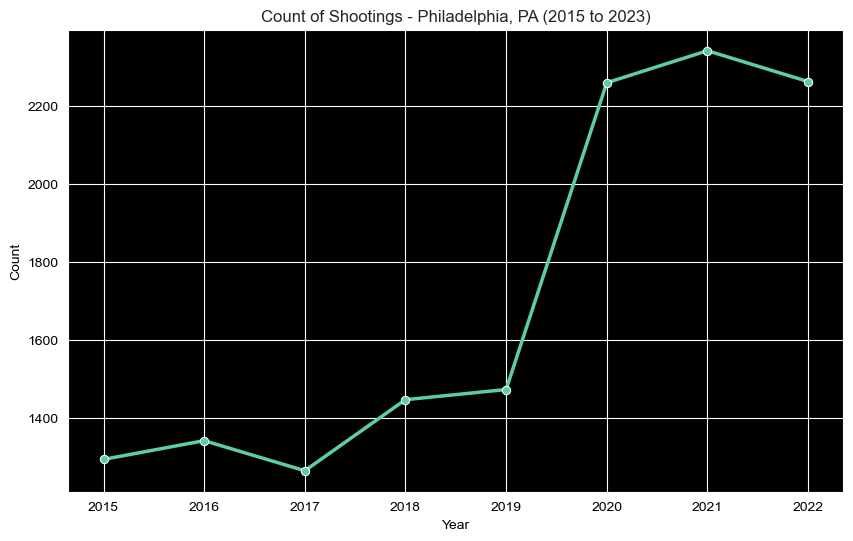

In [29]:
# Organize counts of shootings by year
by_year = df.groupby('year').size().reset_index(name='Count')

# Set up the plot and plot the line graph
sns.set_style("darkgrid")
plt.figure(figsize=(10, 6))
sns.lineplot(x='year', y='Count', data=by_year, marker='o', color='#5eccab', linewidth=2.5)
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Count of Shootings - Philadelphia, PA (2015 to 2023)')
plt.gca().set_facecolor('black')
plt.tick_params(colors='black')
plt.xlabel('Year', color='black')
plt.ylabel('Count', color='black')
plt.show()


Using Folium, I plotted all of the data points, colored by the year they occurred. I leveraged marker clustering so that way not all ~14,000 points appeared on the map at once, but rather you can zoom into an area of interest. Using a tooltip, I added information about the year, age, sex, and race of the offender, if the offender was injured or deceased, and whether an officer was involved.

In [62]:
import folium
from folium.plugins import MarkerCluster

# Filter out rows with missing geometries
df2 = df.dropna(subset=['point_x', 'point_y'])

# Create a map centered on the calculated location
f = folium.Map(location=[39.99, -75.13], zoom_start=10, tiles='Cartodb dark_matter')

# Define a colormap for different years
cm = {
    2015: '#546319',
    2016: '#c0affb',
    2017: '#e6a176',
    2018: '#00678a',
    2019: '#984464',
    2020: '#5eccab',
    2021: '#cdcdcd',
    2022: '#ddcc77'
}

# Create a marker cluster to help with map performance and aesthetics
marker_cluster = MarkerCluster().add_to(f)

# Iterate over the filtered dataframe rows
for index, row in df2.iterrows():
    latitude = row['point_y']
    longitude = row['point_x']
    year = row['year']
    color = cm.get(year, year)
    race = row['race']
    sex = row['sex']
    age = row['age']
    officer_involved = row['officer_involved']
    offender_injured = row['offender_injured']
    offender_deceased = row['offender_deceased']
    tooltip = f"Year: {year}<br>Race: {race}<br>Age: {age}<br>Sex: {sex}<br>Officer Involved: {officer_involved}<br>Offender Injured: {offender_injured}<br>Offender Deceased: {offender_deceased}"
    
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=5,
        alpha=0.5,
        color=color,
        fill=True,
        fill_color=color,
        tooltip=tooltip
    ).add_to(marker_cluster)

# Add title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Shootings - Philadelphia, PA (2015 - 2022)</b></h3>
             '''
f.get_root().html.add_child(folium.Element(title_html))

# Fit the map bounds to include all the markers
f.fit_bounds(marker_cluster.get_bounds())

# Display the map
f


I decided as another visualization, I wanted to make a heat map of fatal shootings. Heat maps are another great way of visualizing density of events. I filtered the data to only include fatal shooting events, and then used Folium again to create the heat map.

In [35]:
where = f"fatal = '1'"
fatal = carto2gpd.get(url, table_name, where=where)

In [20]:
fatal['point_y'] = fatal.point_y
fatal['point_x'] = fatal.point_x
coords = fatal[['point_y', 'point_x']]

# eliminate rows with missing values
coords = coords.dropna()

In [64]:
m = folium.Map(
    location=[39.99, -75.13],
    tiles='Cartodb dark_matter',
    zoom_start=11)

title_html = '''
             <h3 align="center" style="font-size:20px"><b>Fatal Shootings - Philadelphia, PA (2015 - 2023)</b></h3>
             '''
m.get_root().html.add_child(folium.Element(title_html))


HeatMap(coords).add_to(m)

m